# Abstimmungsresultate in der Schweiz

## Abstract

Diese Datastory betrachtet die Abstimmungsresultate zu eidgenössischen Vorlagen der letzten 25 Jahre. Diese werden verwendet, um Gemeinden mittels [Agglomerative Clustering](https://online.stat.psu.edu/stat857/node/107/) in Gruppen zu unterteilen. Diese Gruppen lassen sich dann genauer untersuchen und mittels statistischen Kennzahlen aus dem Gemeindeportrait des Bundes vergleichen.

Die Story untersucht insgesamt 4 Fragestellungen, zwei betreffen Themenspezifische Abstimmungen und zwei die Entwicklung der politischen Landschaft über die Zeit.

Die erste Fragestellung untersucht den Zusammenhang zwischen dem Ausländeranteil und der Zustimmung zu Initiativen und Vorlagen, in denen es um die Zuwanderung geht. Dabei lässt sich feststellen, dass die grösste Zustimmung zu Initiativen gegen die Zuwanderung aus Gemeinden mit einem sehr tiefen Ausländeranteil kommt.

Bei der zweiten Fragestellung geht es um den Stadt-Land Graben bei Initiativen, die die Landwirtschaft betreffen. Auch hier ist ergeben sich in den Gruppen Unterschiede bei den Indikatoren "Anteil an Siedlungsfläche" und der "Bevölkerungsdichte". Bei diesen Abstimmungen gibt es also urbane und ländliche Lager, die nicht gleich abstimmen. Aber der Zusammenhang ist nicht sehr deutlich und es gibt viele Gemeinden die abweichen.

Die dritte Fragestellung untersucht, wie sich die Gruppen aus den ersten Gruppen des Datensatzes mit denen aus der zweiten Hälfte untersucht. Im ersten Datensatz sind die Konfessionsgrenzen der Schweiz noch zu erkennen, im zweiten verschwinden diese und der Stadt-Land Graben wird relevanter.

Die letzte Fragestellung betrachtet den Rösti-Graben im Verlauf der letzten 25 Jahre. Dabei stellt sich heraus, dass der Röstigraben zwar existiert, aber der Verlauf nicht klar ist. Auch wird der Röstigraben in den neueren Abstimmungen undeutlicher und es gibt auf beiden Seiten Gemeinden, die politisch auf die andere Seite gehören, das betrifft insbesondere die Städte in der Deutschschweiz, die öfter mit der Romandie abstimmen.

## Introduction

Dieses Kapitel beschreibt die beiden Datensätze, die in dieser Abstimmung verwendet werden. Beide stammen vom Bundesamt für Statistik.

### Abstimmungsdaten

In [1]:
from data_manager import Manager

manager = Manager("data/abstimmungen.csv")
manager.load_results()

Der erste Datensatz enthält die Abstimmungsresultate von 1996 bis zum 27. September 2020. Für jede Gemeinde gibt es die Zustimmung in Prozent. Ursprüunglich gibt es für jede Gemeinde und jede Abstimmung eine Zeile. Damit wir den Datensatz zum Clustering verwenden können, müssen wir ihn in die Form einer Matrix bringen, die Reihen sind eine einzelne Gemeinde und die Spalten eine einzelne Abstimmung.

### Gemeindeportrait

Wir verwenden ausserdem das Gemeindeportrait der Schweiz. Dieses enthält ebenfalls sehr viele Informationen und wir wollen nur einen Teil davon anschauen.

In [2]:
manager.read_portrait()

Die Indikatoren können uns Hinweise auf verschiedene Dinge geben. Wir werden den Aulsänderanteil in den Gemeinden verwenden und mit den Zustimmungswerten zu Vorlagen zum Thema Zuwanderung in Bezug setzen.

Die Daten enthalten auch Daten zur Bevölkerungsdichte, zur Siedlungs/Landwirtschaftsfläche. Diese Indikatoren können wir verwenden um städtische und ländliche Gemeinden zu unterscheiden. Des weiteren beinhaltet der Datensatz auch den Gemeindecode des Bundesamts für Statistik. Mit diesem können wir weitere Daten mit den einzelnen Gemeinden verknüpfen und am Schluss auch eine Karte der Schweizer Gemeinden einfärben.

### Fragestellungen

In der Schweiz gibt es im Vergleich zum Ausland sehr viele Abstimmungen zu den unterschiedlichsten Themen. Die Resultate dieser Abstimmungen sind zum einen wichtig für die Demokratie, aber sie sind auch eine spannende Quelle für statistische Untersuchungen. Denn es nehmen sehr viele Menschen daran teil und sie haben ein hohes Interesse daran, nicht zu lügen.

Die Resultate sind dafür sehr anonym und lassen sich bloss auf einzelne Gemeinden zurückführen.

Als erste Frage wird der Zusammenhang zwischen dem Ausländeranteil und Vorlagen mit einem Zusammenhang zur Zuwanderung untersucht. Dieses Thema ist seit Jahren immer wieder Gegenstand von Initiativen und Referenden. Dabei stellt sich die Frage, ob es der hohe Ausländeranteil in Gemeinden ist, der zu einer hohen Zustimmung führt. Das würde bedeuten, dass die Menschen aufgrund von negativen Erfahrungen mit der Zuwanderung gegen die Zuwanderung sind.

Die nächste Frage geht einem Phänomen auf die Spur, das in der politischen Debatte immer wieder Thema ist: Der Stadt-Land-Graben. Stimmen Menschen auf dem Land anders ab als die Menschen in den Städten? Diese Frage wird im Zusammenhang mit Vorlagen untersucht, die die Landwirtschaft betreffen. Die Landwirtschaftliche Produktion findet vorallem auf dem Land statt und weniger in den Städten. Haben die Leute, die näher bei der Produktion leben eine andere Meinung zum Thema?

Bei den letzten beiden Fragen geht es um die geographische Entwicklung der politischen Landschaft der Schweiz. Nach den Resultaten zur Konzernverantwortungsinitiative, die am Ständemehr scheiterte sind solche Fragen interessant. Das Ständemehr hängt stark davon ab, in welchen Kantonen die Zustimmung stärker oder schwächer ist, in kleinen Kantonen können ein paar hundert Menschen schon ausschlag über das Ständemehr geben.

Bei der Diskussion über das Ständemehr wird oft über den Minderheitenschutz gesprochen. Wichtige Minderheiten in der Schweiz sind die verschiedenen Sprachregionen. Deshalb untersucht die letzte Frage die Entwicklung des sogenannten "Röstigraben". Gibt es diesen überhaupt, wenn ja wo ist er und wie hat er sich über die letzten Jahrzehnte verändert?

## Resultate
In diesem Kapitel werden die Resultate mit Visualisierungen dargelegt.

### Zuwanderungsinitiativen

Aus den Abstimmungsresultaten zu den Zuwanderungsinitiativen in `zuwanderung_initiativen` wird der Datensatz geclustert. In jedem Cluster wird die median-Zustimmung zur Masseneinwanderungsinitiative berechnet. Für die Y-Achse werden min, max, median, 25-Perzentil, 75-Perzentil und der Mittelwert bestimmt und in einem Plot dargestellt.

In [3]:
%pylab inline
plt.rcParams['figure.figsize'] = [16, 8]
plt.rcParams['figure.dpi'] = 100 # 200 e.g. is really fine, but slower

from IPython.display import HTML
import ploting


Populating the interactive namespace from numpy and matplotlib


Ausländer in %                                             \
                       count       mean        std       min        25%   
Cluster (k=9)                                                             
0                      244.0  12.155064   8.710758  0.425532   5.868532   
4                      323.0  15.022242   8.932560  1.282051   8.493974   
3                      208.0  14.617613   7.741361  0.819672   9.076375   
8                      346.0  15.540853   8.715967  1.327434   8.793019   
5                      296.0  17.572019  10.315553  1.656315  10.446454   
6                      153.0  18.621539   8.827096  0.970874  12.003651   
7                      239.0  19.077015   9.118407  3.030303  11.922256   
2                      140.0  20.111142  11.116440  1.960784  12.115816   
1                      236.0  21.522033  10.070924  0.990099  13.824731   

                                                \
                     50%        75%        max   
Cluster (k=9)                                    
0              10.294359  16.486230  41.867470   
4              12.757605  19.391672  50.273546   
3              13.328633  18.011263  40.550840   
8              13.338347  20.371470  48.963173   
5              15.056717  23.591343  50.394228   
6              17.151831  25.398643  40.000000   
7              18.011127  24.747240  55.049082   
2              19.421802  26.062451  58.093797   
1              21.109520  28.816417  55.390428   

              2014-02-09 Volksinitiative «Gegen Masseneinwanderung»  \
                                                              count   
Cluster (k=9)                                                         
0                                                          247.0      
4                                                          324.0      
3                                                          244.0      
8                                                          349.0      
5                                                          304.0      
6                                                          159.0      
7                                                          239.0      
2                                                          141.0      
1                                                          237.0      

                                                                     
                    mean       std   min    25%   50%     75%   max  
Cluster (k=9)                                                        
0              71.034818  5.906714  58.8  67.30  70.0  74.450  93.6  
4              63.622531  3.680198  50.0  61.10  63.3  65.725  76.6  
3              53.894206  4.829922  31.8  50.75  54.5  56.000  72.8  
8              58.992926  3.181392  50.0  56.90  58.8  60.900  70.5  
5              46.326418  5.907103  24.7  42.60  45.8  49.725  71.4  
6              44.347170  5.797870  27.6  41.60  45.0  47.550  72.7  
7              52.253975  2.984254  43.5  50.30  52.2  54.400  59.7  
2              68.150355  6.168834  44.4  65.40  68.9  72.400  82.4  
1              37.164979  5.234290  19.0  33.90  37.2  40.600  52.0

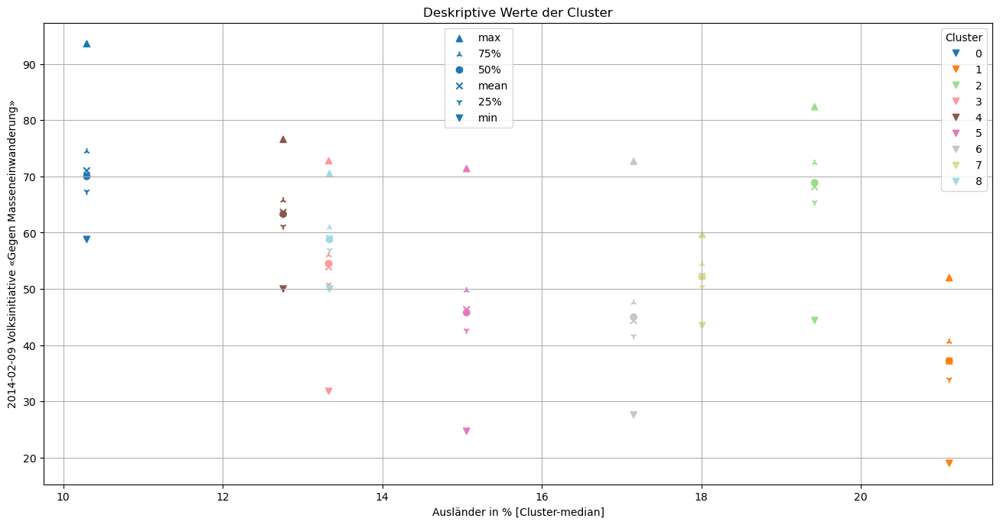

In [4]:
zuwanderung_initiativen = [
    '2020-09-27 Volksinitiative «Für eine massvolle Zuwanderung (Begrenzungsinitiative)»',
    '2018-11-25 Volksinitiative «Schweizer Recht statt fremde Richter (Selbstbestimmungsinitiative)»',
    '2017-02-12 Bundesbeschluss über die erleichterte Einbürgerung von Personen der dritten Ausländergeneration',
    '2016-06-05 Änderung des Asylgesetzes (AsylG)',
    '2016-02-28 Volksinitiative «Zur Durchsetzung der Ausschaffung krimineller Ausländer (Durchsetzungsinitiative)»',
    '2014-11-30 Volksinitiative «Stopp der Überbevölkerung - zur Sicherung der natürlichen Lebensgrundlagen»',
    '2014-02-09 Volksinitiative «Gegen Masseneinwanderung»',
    '2013-06-09 Asylgesetz (AsylG) (Dringliche Änderungen des Asylgesetzes)',
    '2010-11-28 Ausschaffungsinitiative und Gegenvorschlag: Stichfrage',
    '2010-11-28 Bundesbeschluss über die Aus- und Wegweisung krimineller Ausländerinnen und Ausländer im Rahmen der Bundesverfassung (Gegenentwurf zur Ausschaffungsinitiative)',
    '2010-11-28 Volksinitiative «Für die Ausschaffung krimineller Ausländer»',
    '2009-11-29 Volksinitiative «Gegen den Bau von Minaretten»',
    '2009-02-08 Weiterführung des Freizügigkeitsabkommens zwischen der CH und der EU sowie über die Genehmigung des Protokolls über die Ausdehnung des Abkommens auf Bulgarien und Rumänien',
    '2006-09-24 Änderung des Asylgesetzes',
    '2006-09-24 Bundesgesetz über die Ausländerinnen und Ausländer',
    '2000-09-24 Volksinitiative «für eine Regelung der Zuwanderung»',
    '2002-11-24 Volksinitiative «gegen Asylrechtsmissbrauch»',
    '1999-06-13 Asylgesetz',
    '1999-06-13 Bundesbeschluss über dringliche Massnahmen im Asyl- und Ausländerbereich',
    '1997-06-08 Volksinitiative «EU-Beitrittsverhandlungen vors Volk!»',
    '1996-12-01 Volksinitiative «gegen die illegale Einwanderung»',
]
ploting.explore_stats(
    manager,
    zuwanderung_initiativen,
    "Ausländer in %",
    '2014-02-09 Volksinitiative «Gegen Masseneinwanderung»',
    9
)

Am linken Rand des Plots ist die Gruppe $0$ der Gemeinden mit dem tiefsten Anteil an Ausländern, der Median beträgt ca $10.3$, weniger als die Hälfte des Medians in der Gruppe $1$ ganz rechts. (Die Reihenfolge der Gruppennummern hat keinen Zusammenhang mit der Zustimmung oder dem Ausländeranteil). Dazwischen liegen die anderen Gruppen, wobei es zwischen dem tiefsten und dem zweittiefsten Ausländeranteil eine grössere Lücke gibt.

Der Ausländeranteil in der Gruppe ganz links ist deutlich tiefer als in den anderen Gruppen und gleichzeitig ist die Zustimmung zur Masseneinwanderungsinitiative am höchsten. In der Gruppe mit dem höchsten Anteil an Ausländern ist die Zustimmung dagegen am tiefsten.

Dazwischen gibt es auch die Gruppe $2$, die einen hohen Anteil an Ausländern hat und auch eine hohe Zustimmung zur Initiative hatte. Während es an den extremen also deutlich ist, ist es dazwischen nicht so deutlich. Es scheint ein lokales Minum um ca. $16$% zu geben, bei dem die Zustimmung tiefer ist als bei einem höheren oder einem tieferen Ausländeranteil.

### Landwirtschaft

Als nächstes werden Initiative und Vorlagen betrachtet, die mit der Landwirtschaft zusammenhängen. Dabei soll untersucht werden, ob es einen Stadt-Land Graben gibt.

Es werden wieder Vorlagen mit Zusammenahng zum Thema ausgesucht und damit geclustert. Die Gruppen werden dann anhand der Siedlungsfläche in % miteinander verglichen. Die Siedlungsfläche in Prozent wird als Indikator für die Urbanität der Gemeinden verwendet. Im Appendix gibt es dazu auch einen Vergleich mit der Bevölkerungsdichte und einem klaren Zusammehnang zwischen den beiden Indikatoren.

Siedlungsfläche in %                                             \
                             count       mean        std       min        25%   
Cluster (k=9)                                                                   
0                            156.0   3.340621   3.582256  0.138897   1.364009   
2                            221.0   7.541125   7.475522  0.472712   2.698805   
5                            261.0   8.278313   4.838577  0.659845   5.131004   
3                            202.0  11.703164  11.071457  2.184315   5.258329   
6                            270.0  14.323354  14.666830  1.464919   5.994266   
1                            483.0  16.959881  10.694790  2.754491   9.241991   
4                            200.0  23.254755  21.706399  0.259740   7.271788   
8                             82.0  29.220344  28.035933  1.206897   8.116913   
7                            310.0  21.645334  14.692586  0.990763  10.627832   

                                                \
                     50%        75%        max   
Cluster (k=9)                                    
0               2.336863   4.096688  27.343750   
2               5.389222   9.352518  51.794872   
5               7.425265  10.526316  34.068966   
3               7.767072  13.705114  64.338235   
6               9.241703  15.771294  83.091787   
1              14.044944  21.838534  74.131274   
4              14.257086  34.275643  97.260274   
8              16.450314  47.418326  94.237288   
7              18.702675  29.187198  91.176471   

              2020-09-27 Bundesgesetz über die Jagd und den Schutz wildlebender Säugetiere und Vögel (Jagdgesetz, JSG)  \
                                                                                                                 count   
Cluster (k=9)                                                                                                            
0                                                          158.0                                                         
2                                                          256.0                                                         
5                                                          265.0                                                         
3                                                          202.0                                                         
6                                                          270.0                                                         
1                                                          486.0                                                         
4                                                          214.0                                                         
8                                                           83.0                                                         
7                                                          310.0                                                         

                                                                        
                    mean        std   min     25%    50%     75%   max  
Cluster (k=9)                                                           
0              79.727215   8.981046  55.9  73.500  80.30  87.400  97.1  
2              63.118272  10.222503  39.8  53.725  61.40  70.200  92.3  
5              63.633208   6.426699  48.0  59.100  63.20  68.100  82.9  
3              43.952475   5.578701  29.1  39.900  43.30  47.575  63.1  
6              49.285185   6.566412  34.9  44.200  48.85  53.400  71.1  
1              50.883128   4.400703  38.8  47.900  50.90  53.500  64.8  
4              47.106542   8.532828  27.8  40.825  47.30  51.800  79.6  
8              37.559036   6.665328  25.8  33.800  36.90  39.800  77.3  
7              45.868387   4.769879  36.9  42.800  44.85  47.875  64.4

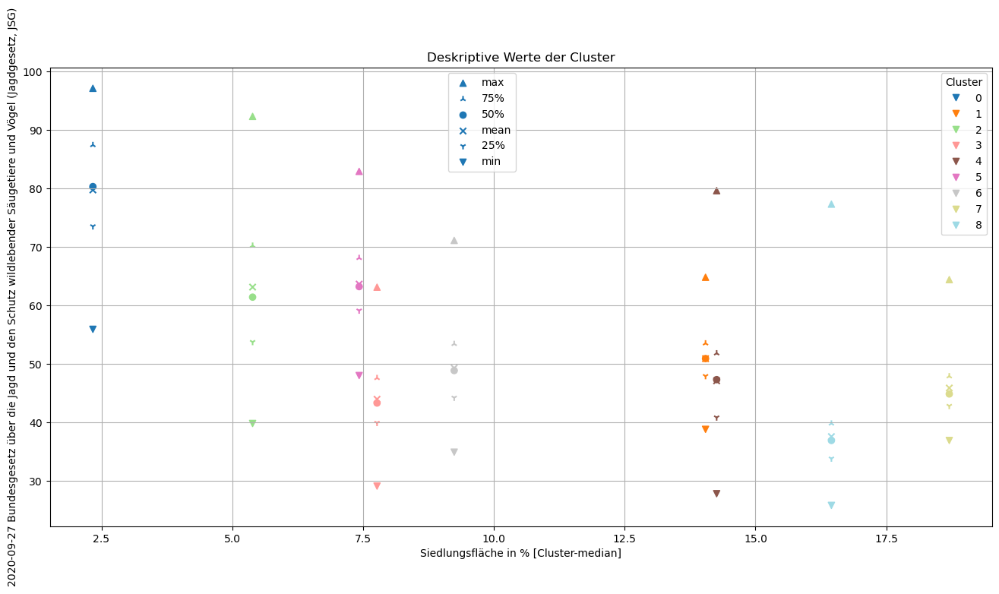

In [5]:
agriculture_votes = [
    '2020-09-27 Bundesgesetz über die Jagd und den Schutz wildlebender Säugetiere und Vögel (Jagdgesetz, JSG)',
    '2019-02-10 Volksinitiative «Zersiedelung stoppen - für eine nachhaltige Siedlungsentwicklung (Zersiedelungsinitiative)»',
    '2018-11-25 Volksinitiative «Für die Würde der landwirtschaftlichen Nutztiere (Hornkuh-Initiative)»',
    '2018-09-23 Volksinitiative «Für Ernährungssouveränität. Die Landwirtschaft betrifft uns alle»',
    '2018-09-23 Volksinitiative «Für gesunde sowie umweltfreundlich und fair hergestellte Lebensmittel (Fair-Food-Initiative)»',
    '2017-09-24 Bundesbeschluss über die Ernährungssicherheit',
    '2016-09-25 Volksinitiative «Für eine nachhaltige und ressourceneffiziente Wirtschaft (Grüne Wirtschaft)»',
    '2016-06-05 Volksinitiative «Für eine faire Verkehrsfinanzierung»',
    '2016-02-28 Bundesgesetz über den Strassentransitverkehr im Alpengebiet (Sanierung Gotthard-Strassentunnel)',
    '2016-02-28 Volksinitiative «Keine Spekulation mit Nahrungsmitteln!»',
]

ploting.explore_stats(
    manager,
    agriculture_votes,
    "Siedlungsfläche in %",
    "2020-09-27 Bundesgesetz über die Jagd und den Schutz wildlebender Säugetiere und Vögel (Jagdgesetz, JSG)",
    9
)

In den Städten war die Zustimmung zur ausgewählten Vorlage tiefer als in den ländlichen Gemeinden. Den Stat-Land Graben gibt es also bei dieser Vorlage, bei der es um die Landwirtschaft geht. Und die Gemeinden lassen sich durch die Vorlagen in Gruppen einteilen, die der Unterscheidung zwischen Stadt und Land entsprechen.

Die Streuung in den Gruppen ist aber überall ziemlich gross, es ist also kein klarer Stadt-Land Graben, sondern eine Tendenz. Alle Gruppen haben Überschneidungen, sogar die extremsten. In der Gruppe mit der tiefsten Medianzustimmung gibt es Gemeinden mit einer höheren Zustimmung als die tiefste Zustimmung in der Gruppe mit der höchsten Zustimmung.

## Veränderung im Laufe der Zeit

Wie hat sich die politische Landschaft der Schweiz in den letzten Jahren verändert? Um diese Frage zu beantworten halbieren wir unseren Datensatz in der Mitte und clustern mit der älteren und der neueren Hälfte die Schweiz. Die Cluster stellen wir auf einer geographischen Karte dar.

In [6]:
latest = manager.votations[:int(len(manager.votations) / 2)]
oldest = manager.votations[-int(len(manager.votations) / 2):]

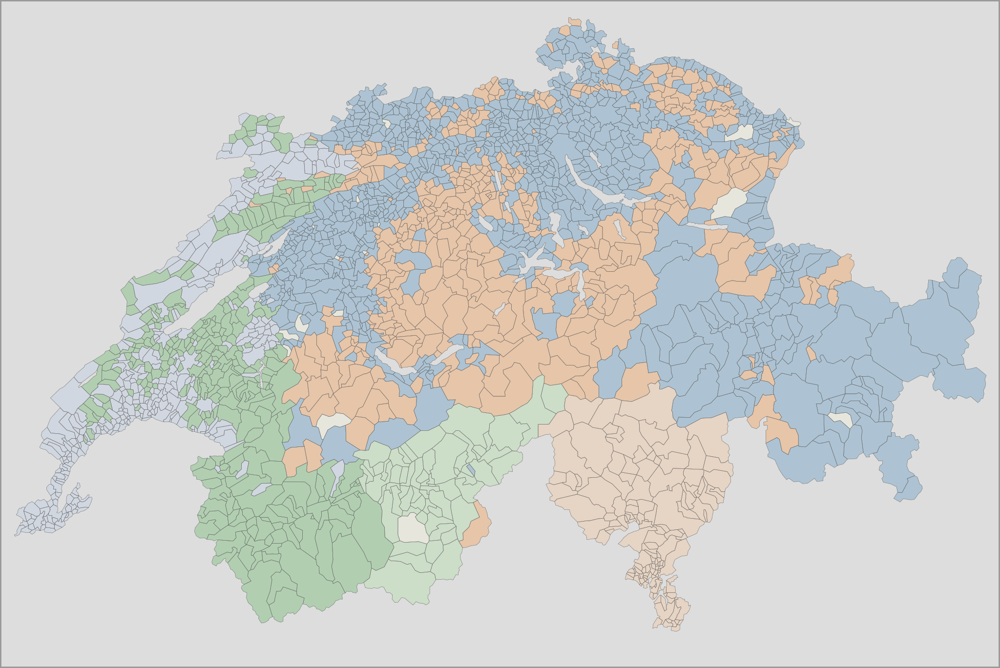

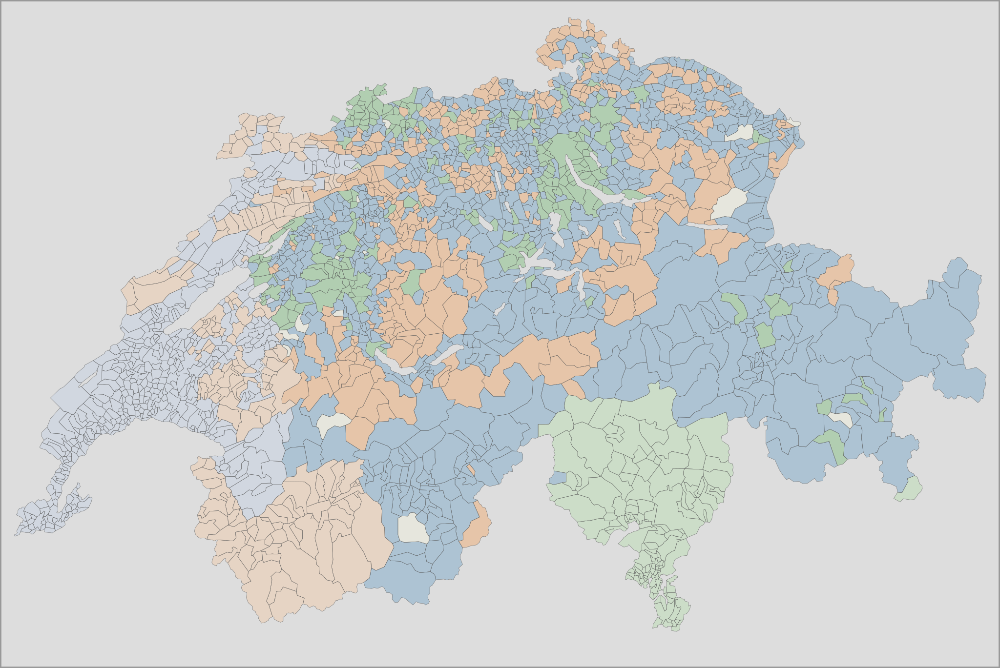

In [7]:
manager.cluster_results_agglomerative(oldest)
manager.join_portrait()

display(HTML("<h2>Alte Hälfte</h2>"))
ploting.show_map(manager.joined_data, k=6)

manager.cluster_results_agglomerative(latest)
manager.join_portrait()
display(HTML("<h2>Neue Hälfte</h2>"))

ploting.show_map(manager.joined_data, k=6)



In der oberen, älteren Karte sehen wir die Schweiz in 6 Gruppen aufgeteilt basierend auf der älteren Hälfte der Abstimmungen in unserem Datensatz. Wir sehen den ganzen Kanton Tessin als eine einzige Gruppe.

In der Deutschweiz gibt es hauptsächlich zwei Gruppen von Gemeinden, die mehr oder weniger den historsichen Konfessionen entsprechen, die Katholische Inner- und Ostschweiz und die Reformierten Kantone Zürich und Bern. Wobei in der Innerschweiz auch einige Gemeinden eher reformiert sind. Die dritte Gruppe ist der deutschsprachige Teil des Wallis, das in einem eigenen Cluster ist.

In der Romandie gibt es zwei Gruppen, die aber nicht an den Konfessionsgrzenzen ausgerichtet sind.

Die untere, neue Karte zeigt jetzt die Unterteilung aufgrund der neueren Abstimmungsresultate. In der Deutsschweiz gibt es immernoch drei Gruppen, aber es sind andere Gruppen. In der Hellgrünen sind Städte wie Zürich, Basel, Bern und Winterthur sowie weitere vereinzelte Gemeinden in der Deutsschweiz. Daneben gibt es die orange und die dunkelblaue Gruppe, zu letzterer gehört jetzt auch der deutschsprachige Teil des Kanton Wallis.

Das Tessin ist immernoch fast eine Gruppe für sich, mit zwei Ausnahmen: Bosco das jetzt in der blauen deutschsprachigen Gruppe ist und italienischsprachige Brusio ganz im Süden von Graubünden, das ebenfalls zur Tessin-Gruppe gehört.

In der Romandie sind die Veränderungen weniger stark als in der Deutsschweiz. Es gibt weiterhin zwei Gruppen, die sich leicht verändert haben, aber in weiten teilen gleich geblieben sind. Am augenscheinlichsten ist der Wechsel des Südwestlichen Zipfels der Waadt zur gleichen Gruppe wie die meisten Gemeinden im Kanton.

## Historischer Röstigraben

Als letztes wollen wir noch schauen, wie sich der Röstigraben historisch entwickelt hat. Dazu wollen wir die Abstimmungen gruppiert nach 4-Jahres-Intervallen (1 Legislaturperiode) betrachten. Wir Clustern die Gemeinden wieder, aber nur noch in zwei Gruppen.

In [8]:
year_groups = [(1996, 2000), (2001, 2005), (2006, 2010), (2010, 2014), (2015, 2019), (2020, 2020)]

def show_year_group(index):
    start, end = year_groups[index]
    selected = filter(lambda t: start <= int(t.partition('-')[0]) <= end, manager.votations)
    
    manager.cluster_results_agglomerative(list(selected))
    manager.join_portrait()
    display(HTML(f"<h2>{start} - {end}</h2>"))
    ploting.show_map(manager.joined_data, k=2)

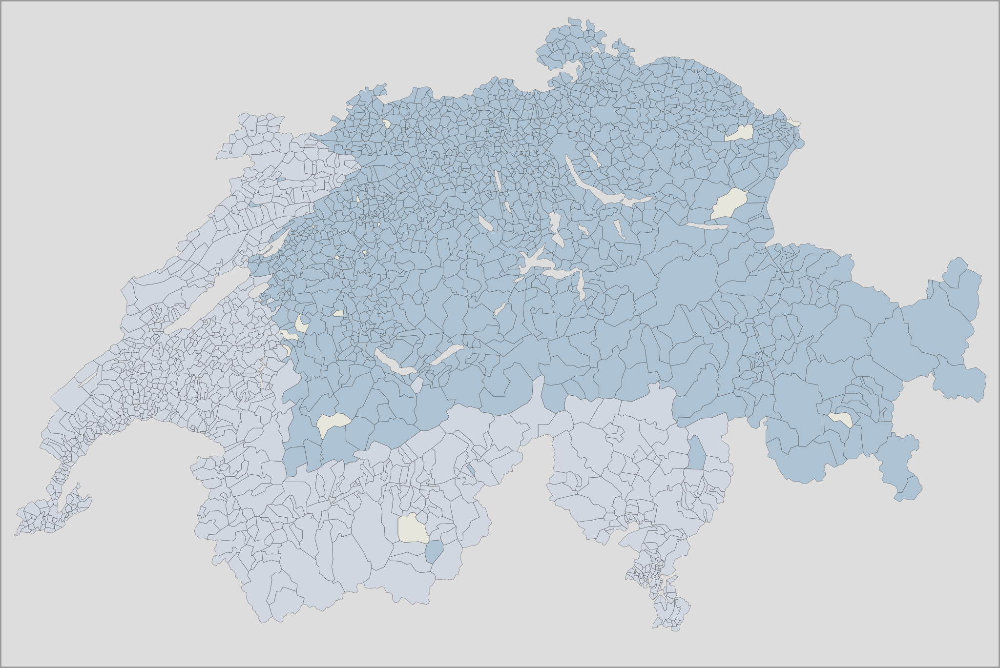

In [9]:
show_year_group(0)

Relativ klare Unterteilung der Sprachregionen, das Tessin ist in der Gruppe der Romandie, gleich wie das Unter- und Oberwallis.

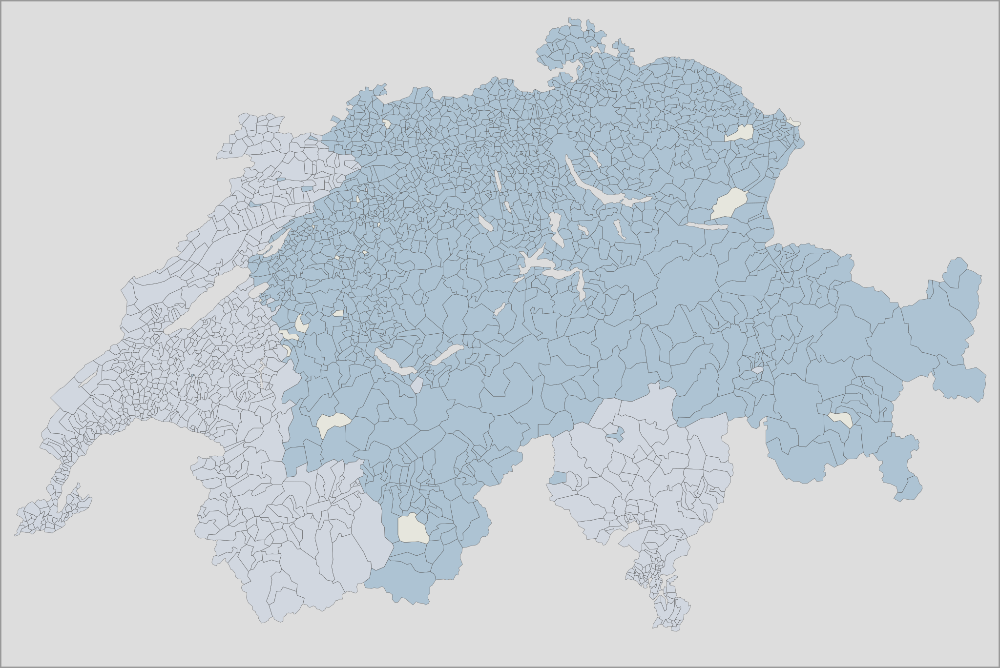

In [10]:
show_year_group(1)

Das Oberwallis gehört in dieser Zeit zur restlichen Deutsschweiz, sonst ähnelt es sich sehr.

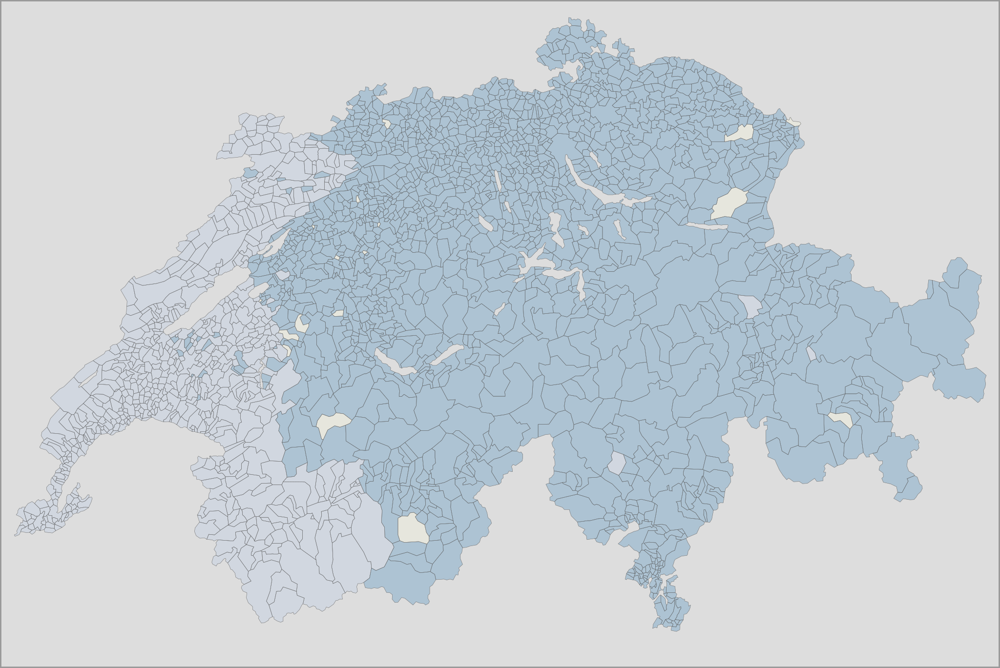

In [11]:
show_year_group(2)

In dieser Zeitspanne sind das Unterwallis und das Tessin bei der Deutsschweiz.

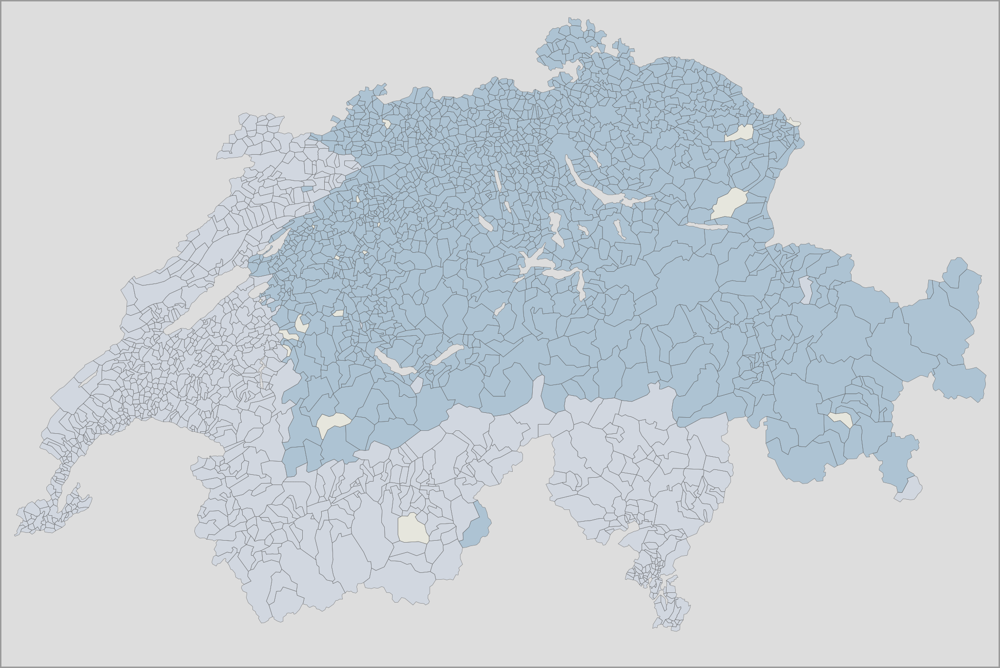

In [12]:
show_year_group(3)

Diese Karte ist wieder sehr ähnlich zur Zeitspanne von 1996 - 2000, das Tessin und das ganze Wallis in der Romandie.

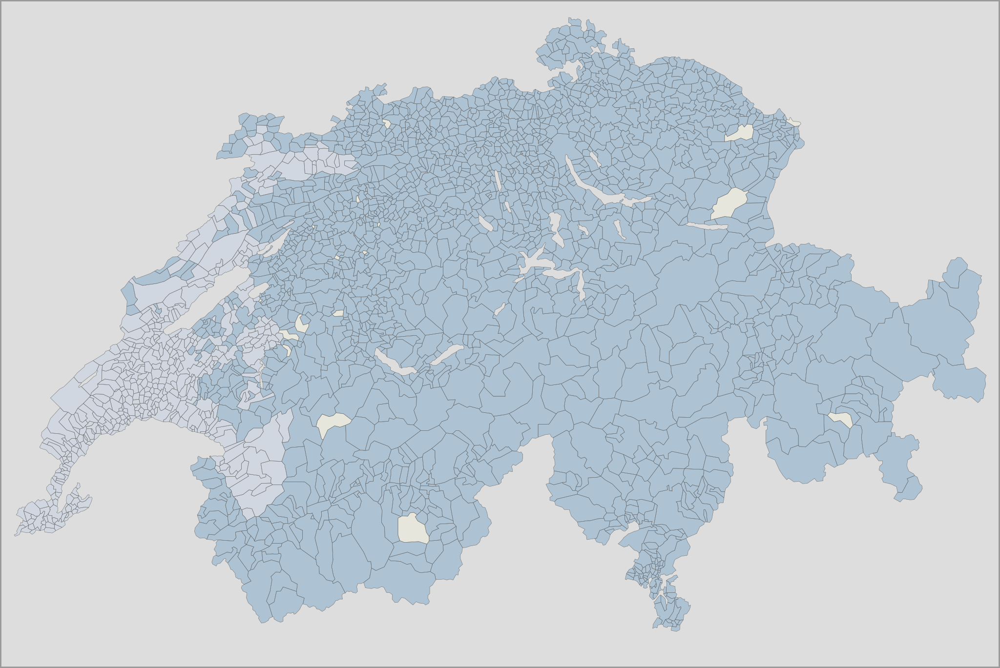

In [13]:
show_year_group(4)

In dieser Periode ist das ganze Wallis und auch Teile des Kanton Fribourg in der Gruppe der Deutsschweizer Kantone, so wie auch Teile des Juras, die bisher immer bei der Romandie gewesen sind.

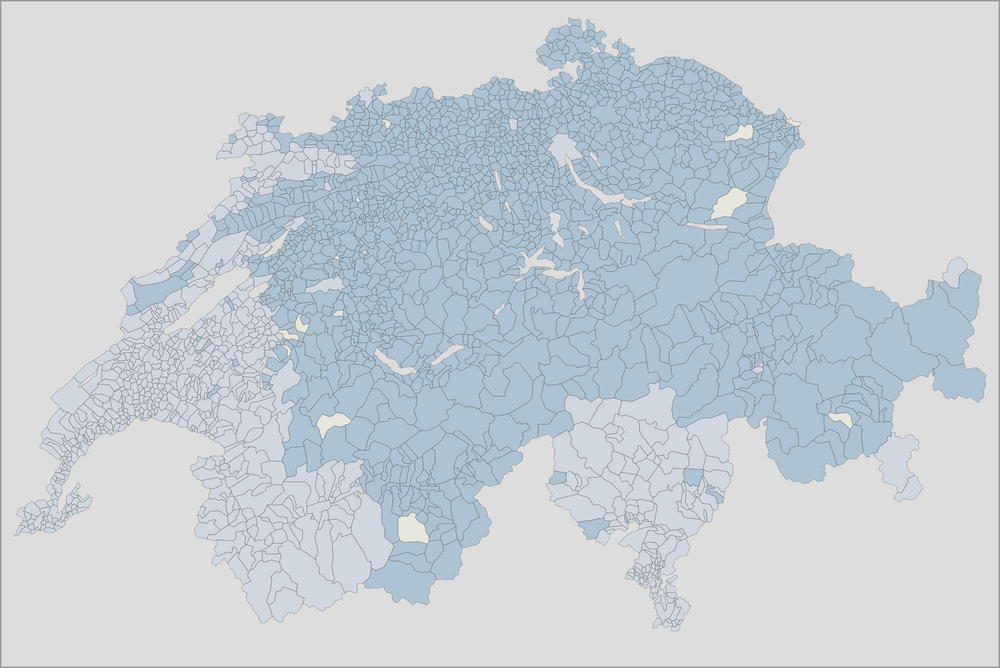

In [14]:
show_year_group(5)

Dieser letzte Datensatz beinhaltet erst ein Jahr, da die Legislatur eben erst begonnen hat. Das Tessin ist in der Gruppe der Romandie, das Unterwallis ebenfalls. Das Oberwallis ist in der Gruppe der Deutsschweiz und Teile das Kanton Juras und auch Teile des Kanton Neuenburg.

Dafür sind in dieser Gruppierung die grossen Städte der Deutsschweiz in der Romandie: Zürich, Basel und Bern (und Baden). Auch im Kanton Graubünden sind 3 Gemeinden in dieser Gruppe. Dafür gibt es im Tessin Gemeinden, die in der Deutsschweizer Gruppe sind.

Zum Röstigraben lässt sich also folgendes Sagen:

Es gab und gibt ihn zwar, doch sein Verlauf ist nicht eindeutig und hat sich auch immer wieder verändert. Es gab Regionen, wie das Tessin und das Wallis, die nicht immer auf der gleichen Seite des Grabens waren.

In den neueren Abstimmungen sehen wir auch immer mehr Ausreisser, also Gemeinden die politisch in einer anderen Sprachregion sind. In der Deutsschweiz sind es vorallem die Städte, die eher so abstimmen wie die Romandie.

## Conclusion

### Zuwanderungsvorlagen

Der Zusammenhang zwischen dem Ausländeranteil und der Zustimmung zu Zuwanderungskritischen Initiativen existiert, doch es gibt auch Gegenbeispiele die in den Vergleichen deutlich werden. Klar ist aber, dass die höchste Zustimmung zu solchen Vorlagen in Gemeinden ist, wo der Ausländeranteil sehr tief ist. Das legt nahe, dass die Zustimmung zu solchen Initiativen eher das Resultat von Ängsten ist und nicht von tatsächlichen Erfahrungen kommt.

### Stadt-Land Graben

Es gibt einen leichten Zusammenhang zwischen der Zustimmung zu Vorlagen, die die Landwirtschaft betreffen und der Siedlungsfläche in Prozent. Aber ein Stadt-Land-Graben lässt sich mit den Resultaten nicht nachweisen.


### Veränderungen der Landschaft

Die Lager werden durchmischter und historische Gegebenheiten wie die Konfession verlieren an Einfluss auf die Resultate. Die Sprachregionen bleiben weiterhin ein wichtiger Faktor.

### Der Röstigraben

Werden die Gemeinden aufgrund von Abstimmungsresultaten in zwei Gruppen geteilt, taucht der Röstigraben auf, er existiert also. Doch sein Verlauf ist nicht eindeutig und je nach Abstimmungen gehören gewisse Gebiete mal zu einer und mal zur anderen Seite. In den neueren Abstimmungen gibt es mehr Gemeinden, die politisch auf der anderen Seite des Röstigraben stehen, der Röstigraben ist also noch relevant, hat aber an seiner Deutlichkeit verloren.